In [2]:
import numpy as np
import matplotlib.pyplot as plt
from apdt.polygon_class import PolygonField
from apdt.detection import filter_hulls,find_paths,find_trough_nodes
import shapely.geometry as geom
from skimage.filters.thresholding import threshold_local
from skimage.measure import label
from skimage.morphology import skeletonize,dilation,erosion,closing,opening
from matplotlib.path import Path

## Load in data and pre-process

the minimum raster value:  321.2753
the maximum raster value:  417.9084
0.5th percentile:  324.41666229248045
1st percentile:  325.4610653686523
5th percentile:  328.31048583984375
50th percentile:  342.9844055175781
75th percentile:  355.631591796875
90th percentile:  370.5914642333984
95th percentile:  381.4447937011719
99.99th percentile:  416.64740344543435
99.991th percentile:  416.68496138244626
99.995th percentile:  416.72032447021485
99.999th percentile:  417.4212129251098


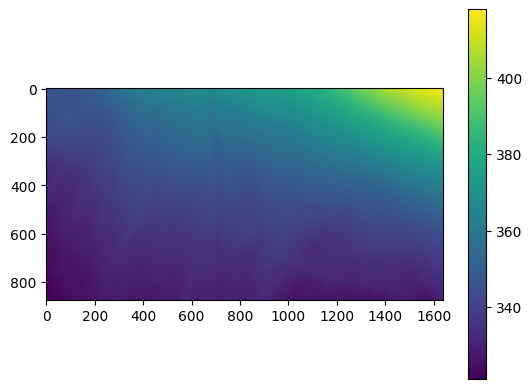

In [5]:
path_in = 'DEMs/70-81_clipStream.tif'
path_out = 'Outputs/Stream/70-81_clipStream_'
polyfield = PolygonField(1,1,path_in)
plt.imshow(polyfield.dem)
plt.colorbar();

Number of cells filled: 1
Number of cells filled: 42900


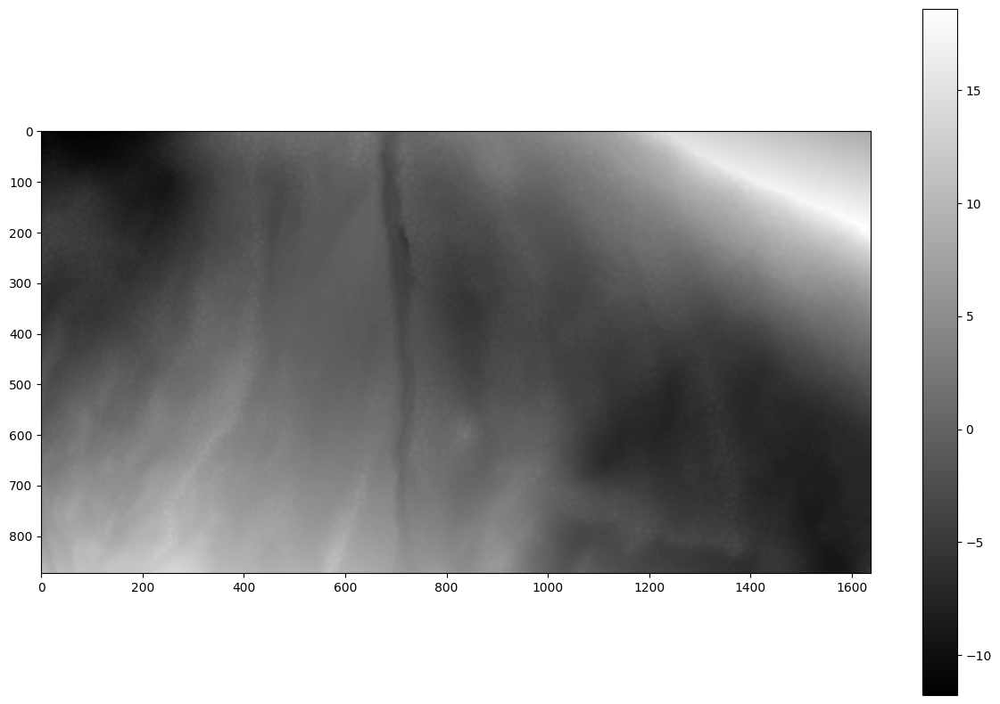

In [3]:
polyfield.fill_dem(0,97)
polyfield.detrend_dem()
fig,ax = plt.subplots(1,1,figsize=(15,10))
im = ax.imshow(polyfield.dem,cmap='gray')
fig.colorbar(im);

## First pass detection

15400

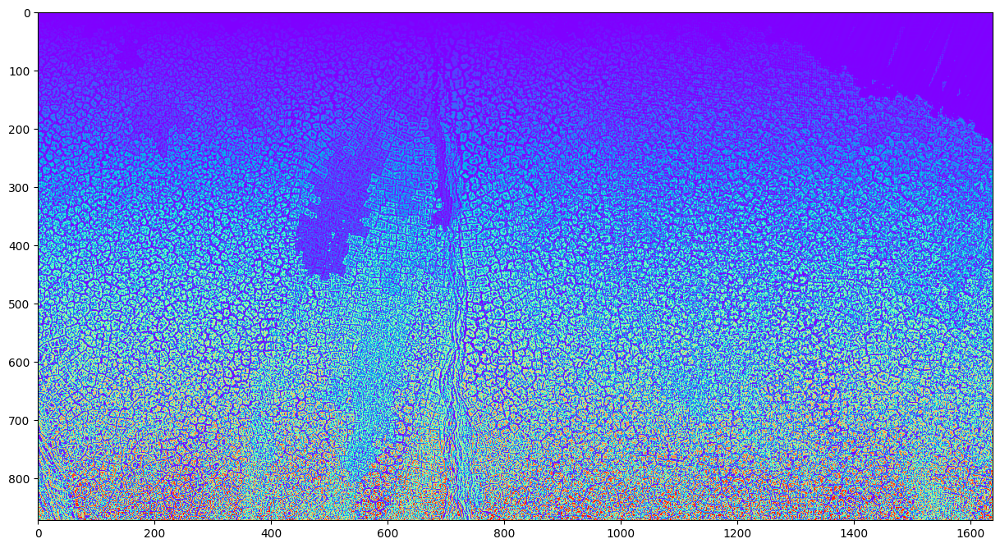

In [4]:
thresh = threshold_local(polyfield.dem,block_size=7)
foreground = polyfield.dem >= thresh
#foreground = erosion(foreground,np.ones((2,2)))
labelled, max_label = label(foreground,return_num=True)

fig,ax = plt.subplots(1,1,figsize=(15,10))
ax.imshow(labelled,cmap='rainbow')
max_label

6850


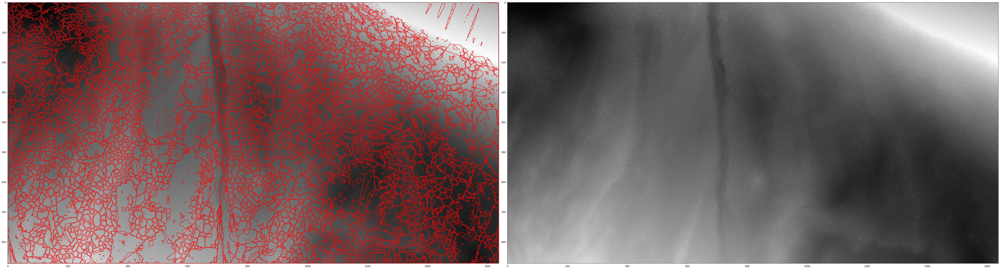

In [5]:
hull_list = []

for key in np.arange(1,max_label):
    y,x = np.where(labelled == key) #find index of all points part of the same outline
    if len(y) >3:
        line = geom.LineString(list(zip(x,y))) # add outlines as shapely LineStrings to dictionary
        hull = line.convex_hull
        if hull.geom_type == 'Polygon':
            hull_list.append(hull)


fig,ax = plt.subplots(1,2,figsize=(60,20),layout='tight')
ax[0].imshow(polyfield.dem,cmap='gray')
ax[1].imshow(polyfield.dem,cmap='gray')
for p in hull_list:
    x,y = p.boundary.coords.xy
    ax[0].plot(x,y,c='red')
print(len(hull_list))

Number of Polygons found: 2429


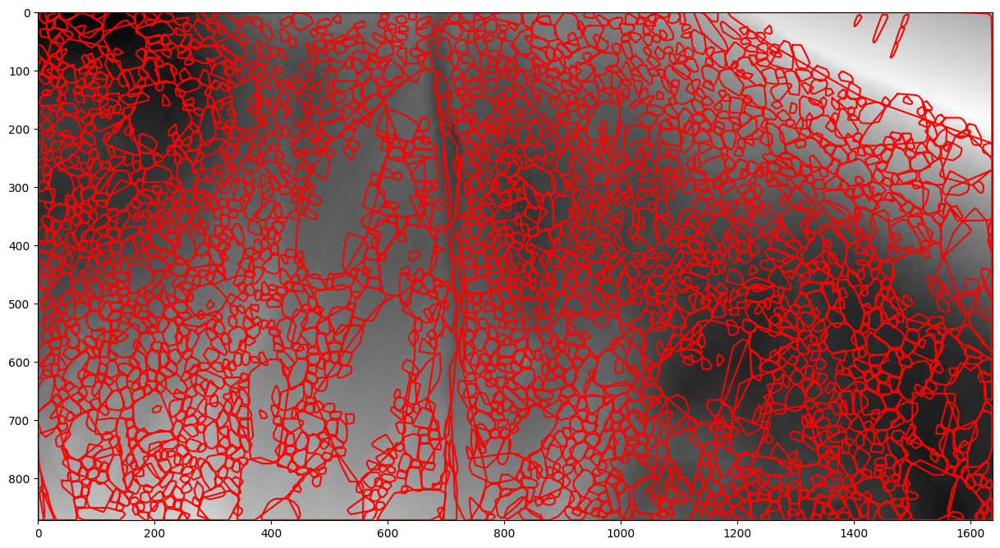

In [6]:
filtered_hulls = filter_hulls(hull_list,100,remove_covered=False)

fig,ax = plt.subplots(1,1,figsize=(15,10))
ax.imshow(polyfield.dem,cmap='gray')
for p in filtered_hulls:
    x,y = p.boundary.coords.xy
    ax.plot(x,y,c='red')

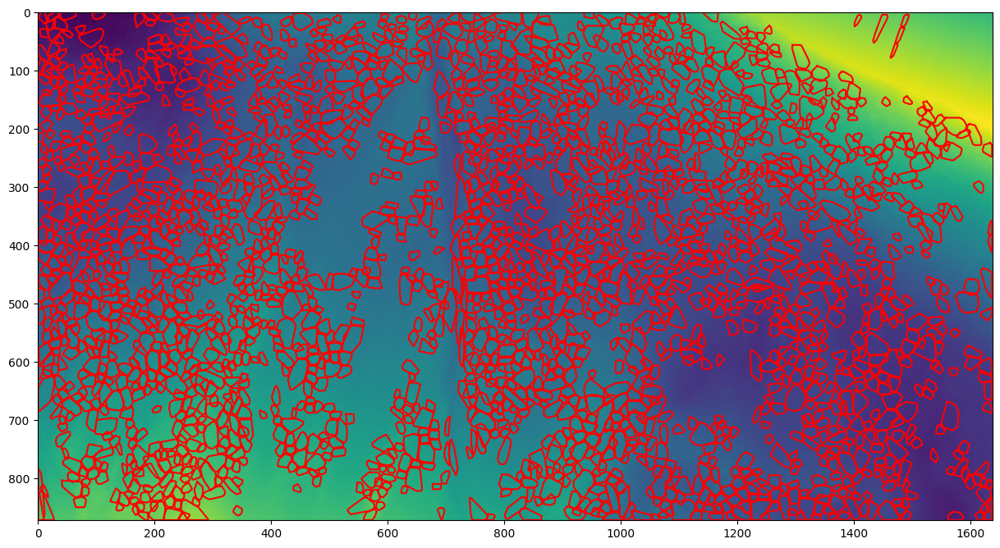

In [7]:
new_filtered = []
for p in filtered_hulls:
    if p.area < 1200:
        new_filtered.append(p)

fig,ax = plt.subplots(1,1,figsize=(15,10))
ax.imshow(polyfield.dem)
for p in new_filtered:
    x,y = p.boundary.coords.xy
    ax.plot(x,y,c='red')

In [12]:
print(len(new_filtered))

2278


In [8]:
polyfield.poly_list = filtered_hulls
dy,dx = polyfield.dem.shape

trough_arr = np.ones([dy,dx]) # initially all 1s
polygon_arr = np.zeros([dy,dx]) # intially all 0s
x, y = np.meshgrid(np.arange(dx), np.arange(dy))
x, y = x.flatten(), y.flatten()
points = np.vstack((x,y)).T # create array of all points in array

n = 1
for p in polyfield.poly_list:
    # Remove current Polygon from trough map:
    x,y = p.boundary.coords.xy #add small buffer to make sure troughs go through close polygons
    hull_vert = [tuple(a) for a in zip(x,y)]
    path = Path(hull_vert) #Create matplotlib path from polygon boundary

    grid = path.contains_points(points)
    grid = grid.reshape((dy,dx)) #Create boolean array with all points inside current polygon

    y_new, x_new = np.where(grid == True)

    for i in range(len(x_new)):
        trough_arr[y_new[i],x_new[i]] = 0
        polygon_arr[y_new[i],x_new[i]] = n

    n+=1


In [9]:
nodes, skel = find_trough_nodes(trough_arr)
edges = find_paths(skel,nodes)

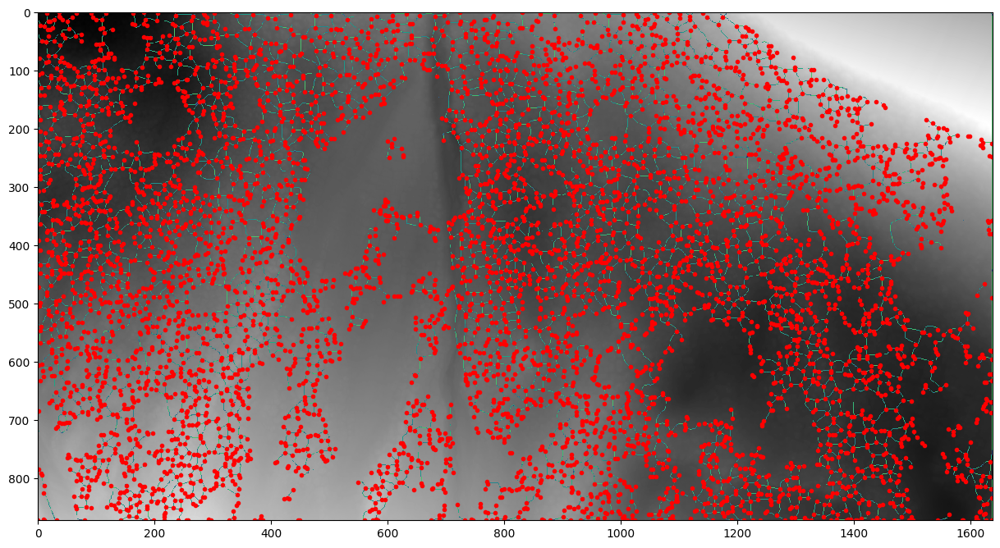

In [10]:
fig,ax = plt.subplots(1,1,figsize=(15,10))
ax.imshow(polyfield.dem,cmap = 'gray')
ma = np.ma.masked_where(dilation(skel,np.ones((3,3)))==0,skel)
ax.imshow(ma)
for n in nodes:
    x,y = n
    plt.scatter(x,y,c='red',marker='.')

In [11]:
polyfield.edges = edges
polyfield.nodes = nodes
polyfield.poly_list = new_filtered # replace Polygons with too large ones taken out
polyfield.save_polygons(path_out+'Polygons')
polyfield.save_troughs(path_out+'Nodes',path_out+'Troughs')

Saved to Outputs/Stream/70-81_clipStream_Polygons
Output saved to Outputs/Stream/70-81_clipStream_Nodes and Outputs/Stream/70-81_clipStream_Troughs.
